In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from datetime import date
sns.set()
%matplotlib inline

In [2]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing

In [3]:
import pwlf

In [4]:
plt.rcParams['figure.figsize'] = [16, 9]

In [5]:
w = pd.read_csv(r'The revised 292 F - 2018-12-31.csv',parse_dates=['Timestamp'], index_col='Timestamp')

In [6]:
w = (w - 32)/1.8
w = w.round(2)

In [7]:
e = pd.read_csv(r'afterQ295(Dec2).csv',parse_dates=['Timestamp'], index_col='Timestamp')

In [8]:
building_list = pd.read_excel('Revised startup and shutdown time all categories.xlsx', sheet_name='Office')
building_4A = building_list[building_list['Climate Zone'] == '4A']
buildings = building_4A['Building ID']

In [9]:
buildings = np.unique(buildings)

In [10]:
len(buildings)

37

In [11]:
buildings = buildings[buildings != 'MD0325ZZ']

In [12]:
building_info = pd.read_excel('extracted data of 295 buildings.xlsx',  index_col=0)

In [13]:
building_info['code']

0      AK0001ZZ
1      AK0013ZZ
2      AK0031AA
3      AL0003AC
4      AL0011ZZ
         ...   
290    IL0303ZZ
291    IL0311ZZ
292    IL2125ZZ
293    IN0031ZZ
294    KY0013ZZ
Name: code, Length: 295, dtype: object

<ipython-input-17-195101c2baa3>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()
<ipython-input-17-195101c2baa3>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()
<ipython-input-17-195101c2baa3>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()
<ipython-input-17-195101c2baa3>:17

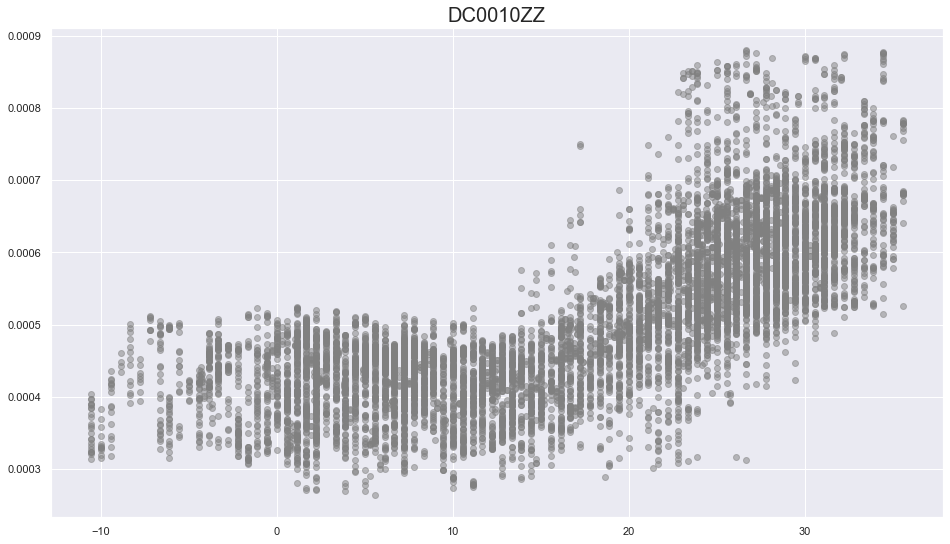

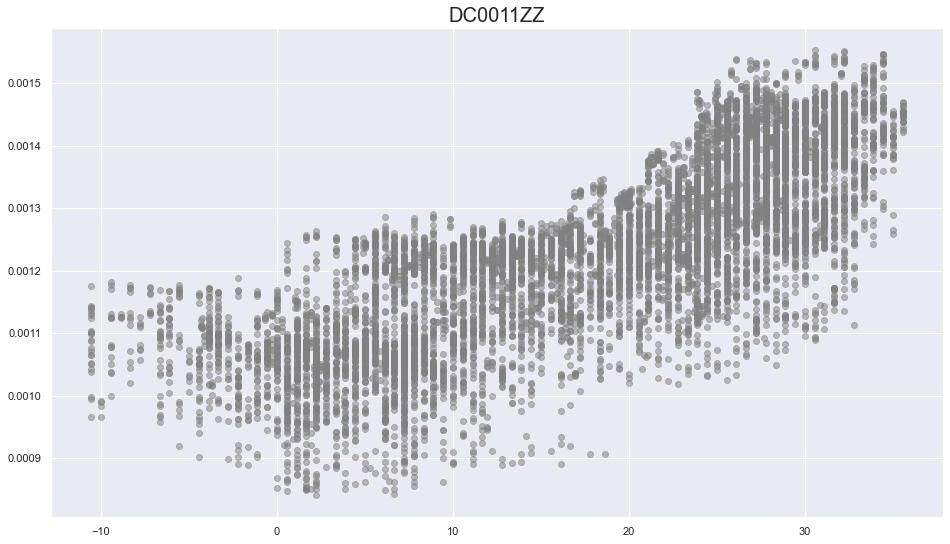

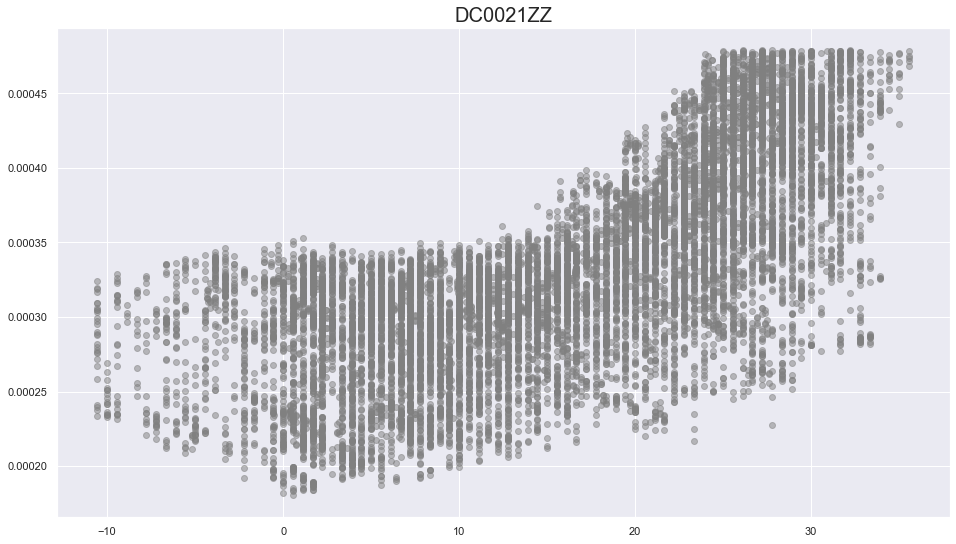

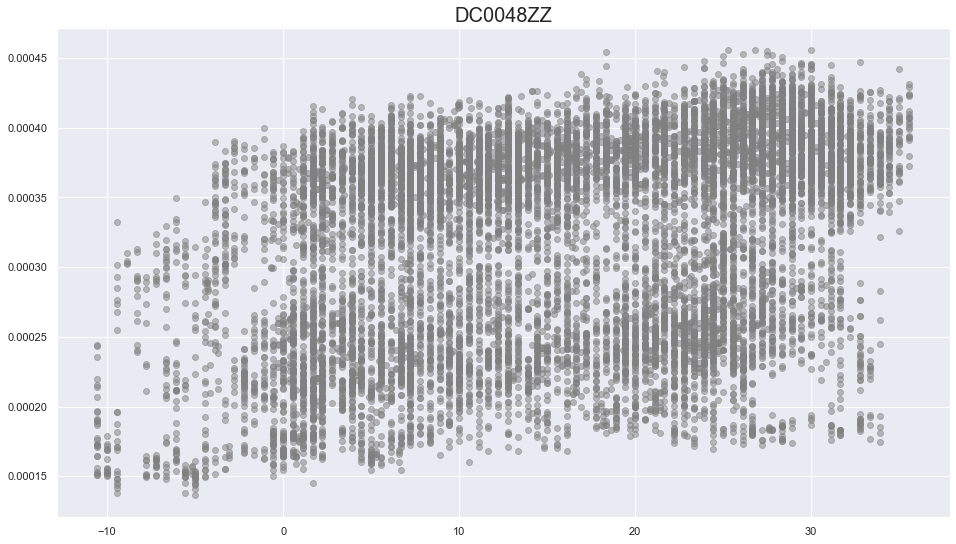

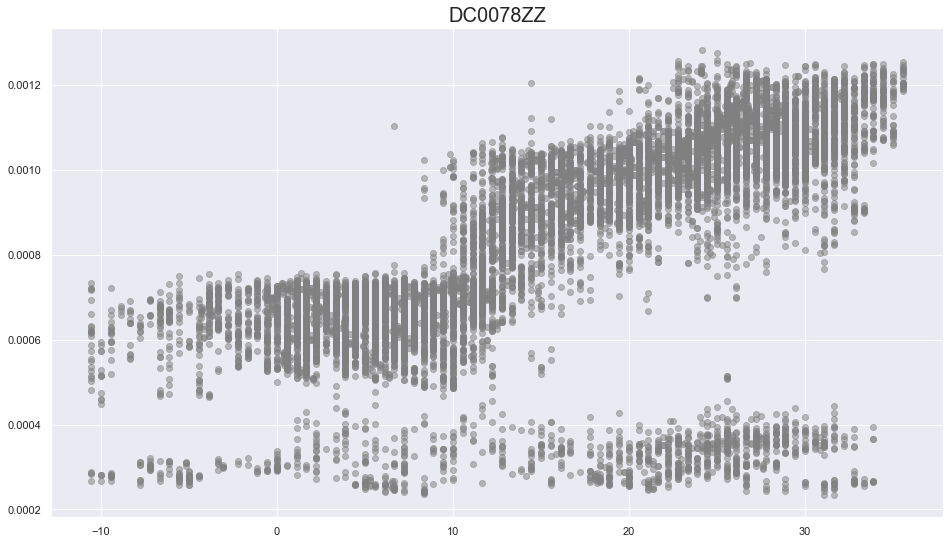

...

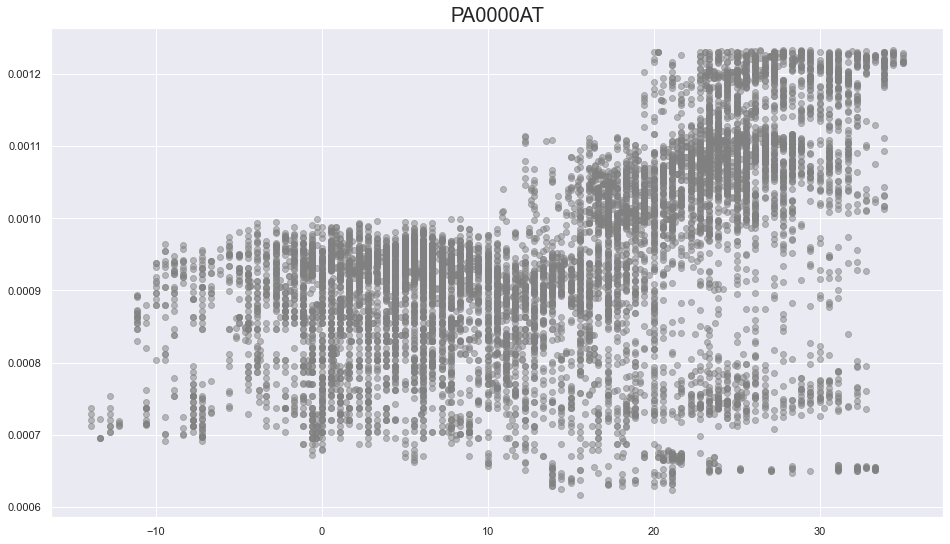

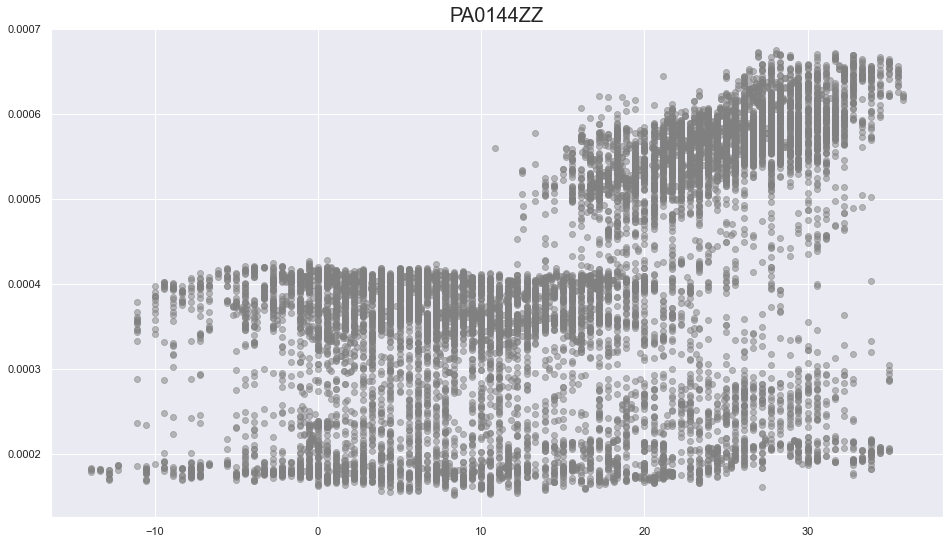

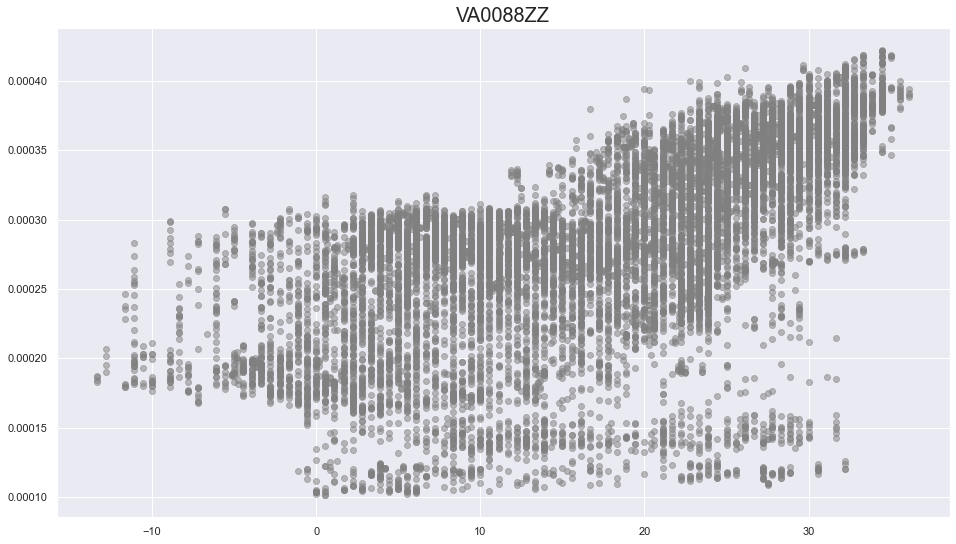

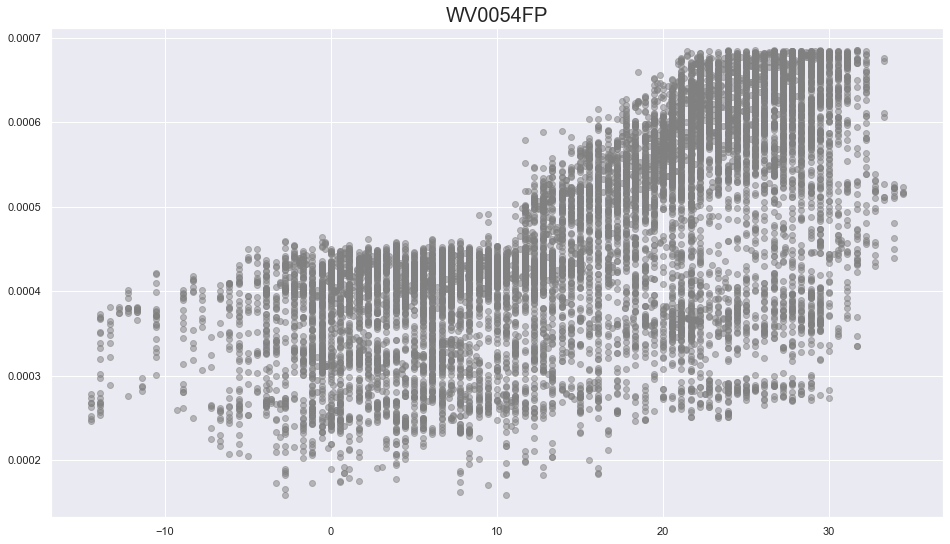

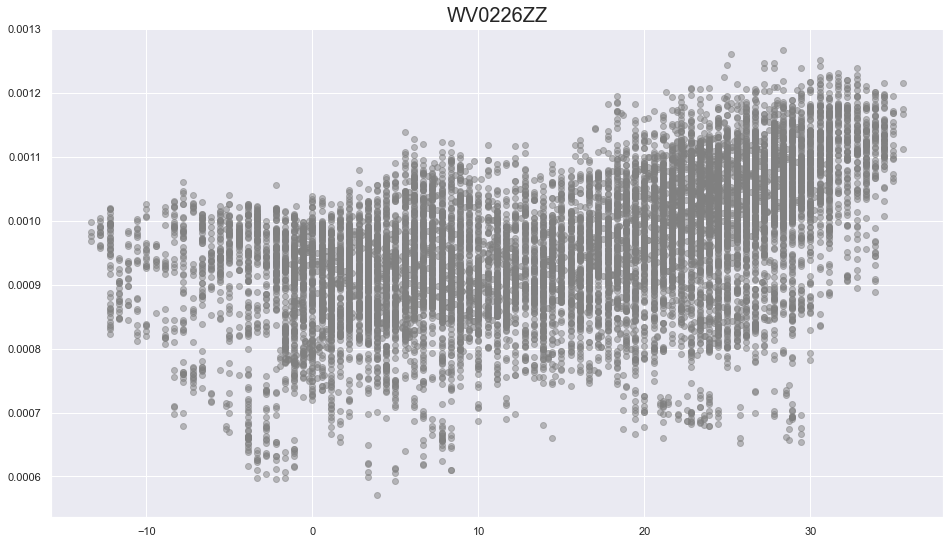

In [17]:
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
#     f = pwlf.PiecewiseLinFit(x, y)
#     res = f.fit(3)
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
#     plt.scatter(x, f.predict(x))
    plt.title(f'{i}', fontsize=20)

## MD0205ZZ & MO0106ZZ, MO0134zz are deleted due to the electricity heating

In [14]:
segment = {'DC0010ZZ': 2,
           'DC0011ZZ': 2,
           'DC0021ZZ': 2,
           'DC0078ZZ': 2,
           'DC0313ZZ': 2,
           'DC0459AF': 2,
           'DC0463ZZ': 2,
           'DC0501BC': 2,
           'DC0505ZZ': 2,
           'MD0000HC': 2,
           'MD0334ZZ': 2,
           'MD0778AG': 2,
           'MO0000AF': 2,
           'MO0127ZZ': 2,
           'NC0002AE': 2,
           'PA0000AT': 2,
           'PA0144ZZ': 2,
           'VA0088ZZ': 2,
           'WV0054FP': 2,
           'WV0226ZZ': 2,
           'MD0205ZZ': 3,
           'MO0106ZZ': 3,
           'MO0134ZZ': 3} 

In [16]:
len(segment)

23

## Holiday and Problem days

'''Winter Jan, Feb
(2018, 1, 1), "New Year's Day") (Monday)
(2018, 1, 15), 'Martin Luther King Jr. Day') (Monday)
(2018, 2, 19), "Washington's Birthday") (Monday)
Spring Mar, Apr, May
(2018, 5, 28), 'Memorial Day') (Monday)
Summer Jun, Jul, Aug
(2018, 7, 4), 'Independence Day') (Wednesday)
Autumn Sep Oct Nov
(2018, 11, 12), 'Veterans Day (Observed)') (Monday)
(2018, 11, 22), 'Thanksgiving') (Thursday)'''

In [15]:
holidays = [
    date(2018, 1, 1),
    date(2018, 1, 15),
    date(2018, 2, 19),
    date(2018, 5, 28),
    date(2018, 7, 4),
    date(2018, 11, 12),
    date(2018, 11, 22),
    date(2018, 9, 3),
    date(2018, 10, 8),
    date(2018, 12, 5)
]

Text(0.5, 1.0, 'DC0078ZZ')

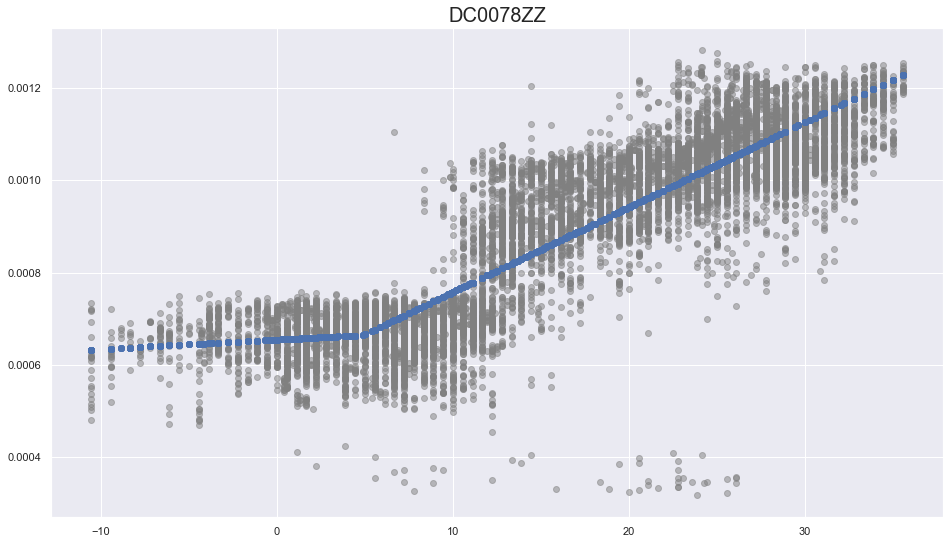

In [18]:
data = pd.DataFrame()
data['w'] = w['DC0078ZZ']
data['e'] = e['DC0078ZZ']
data = data.dropna()
data = data[~np.isin(data.index.date, holidays)]
data = data[data.index.weekday < 5].between_time('6:00', '18:00')

clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]

data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'DC0078ZZ'].values[0])

x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(segment['DC0078ZZ'])
plt.subplots()
plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
plt.scatter(x, f.predict(x))
plt.title('DC0078ZZ', fontsize=20)

In [111]:
balance = f.fit_breaks[1]

In [106]:
a1, a2 = f.slopes

In [107]:
b1, b2 = f.intercepts

In [112]:
def fun1(x, balance):
    if x <= balance:
        return a1 * x + b1
    else:
        return a2 * x + b2

In [118]:
def fun2(x, balance, delta):
    if x <= balance + delta:
        return a1 * x + b1
    else:
        return a2 * x + b2 + delta * (a1 - a2)

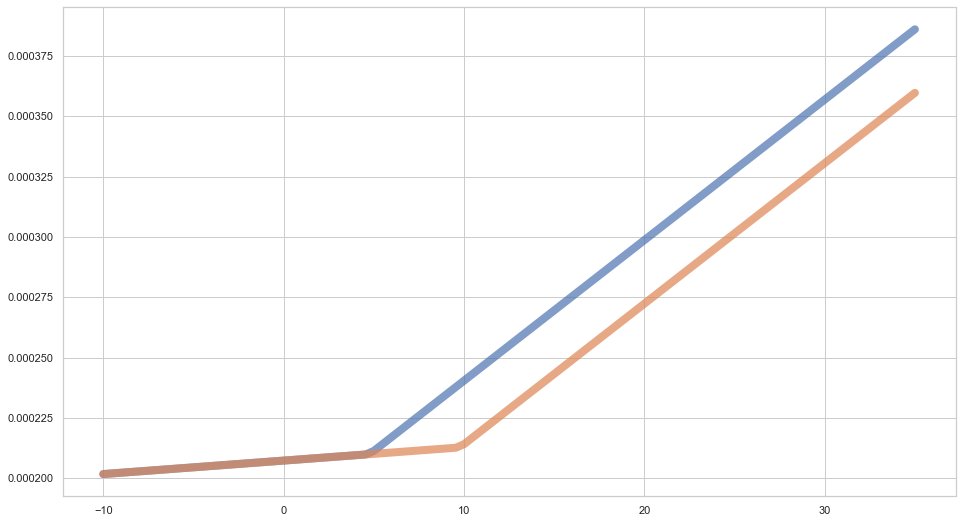

In [119]:
x = np.linspace(-10, 35, 100)
plt.plot(x, [fun1(xi, balance) for xi in x], label='0',alpha=0.7, lw=8)
plt.plot(x, [fun2(xi, balance, delta=5) for xi in x], label='0',alpha=0.7, lw=8)

### regression with cleaning

<ipython-input-18-02ea79a70222>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()
<ipython-input-18-02ea79a70222>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()
<ipython-input-18-02ea79a70222>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


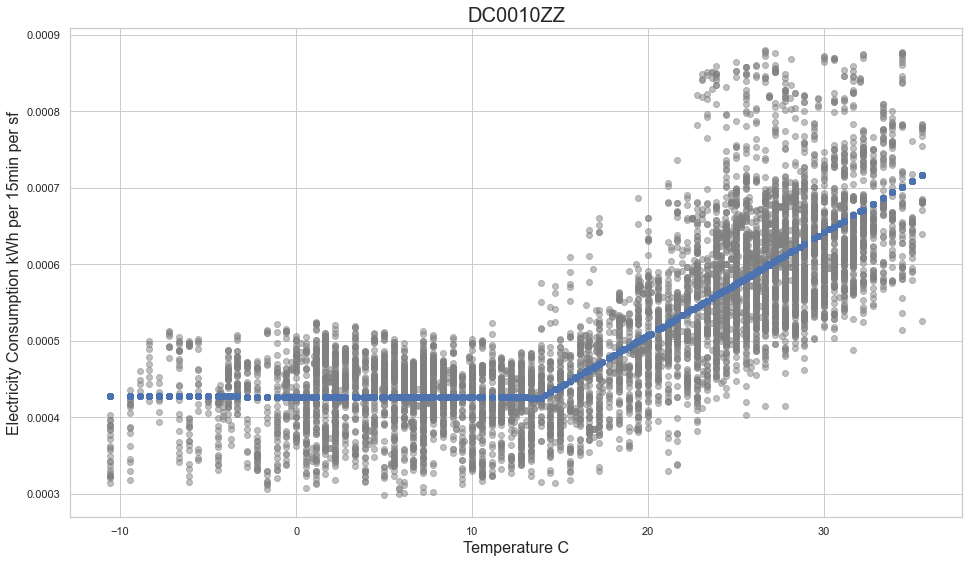

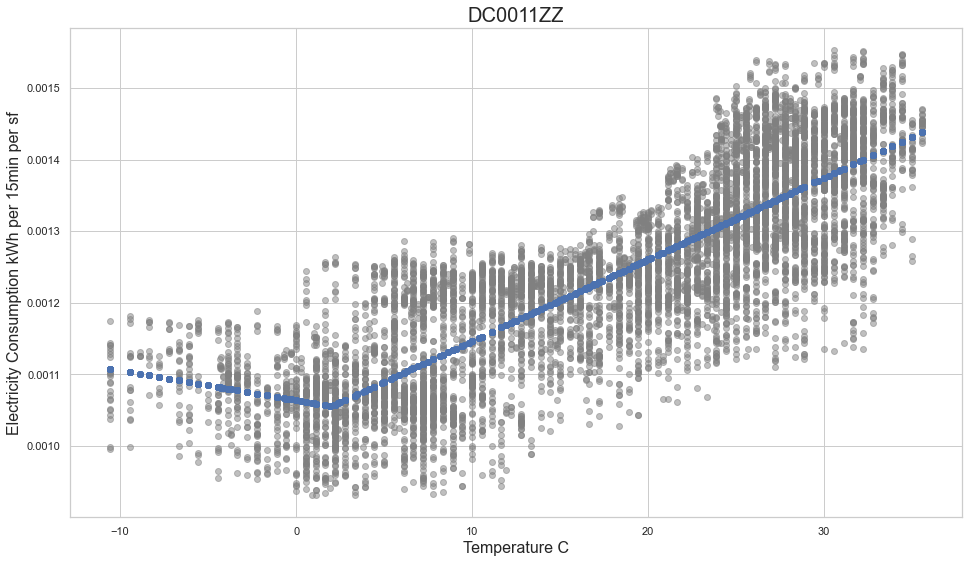

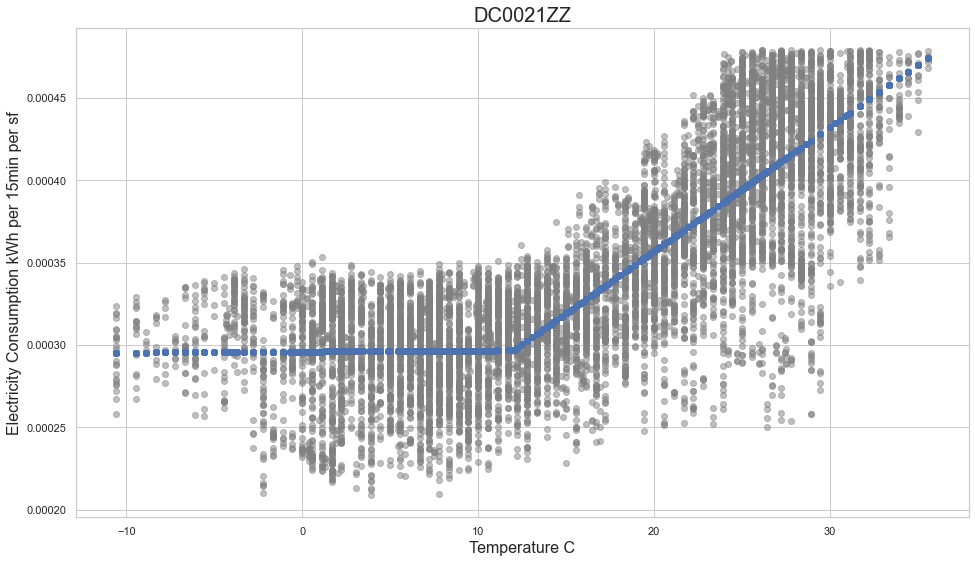

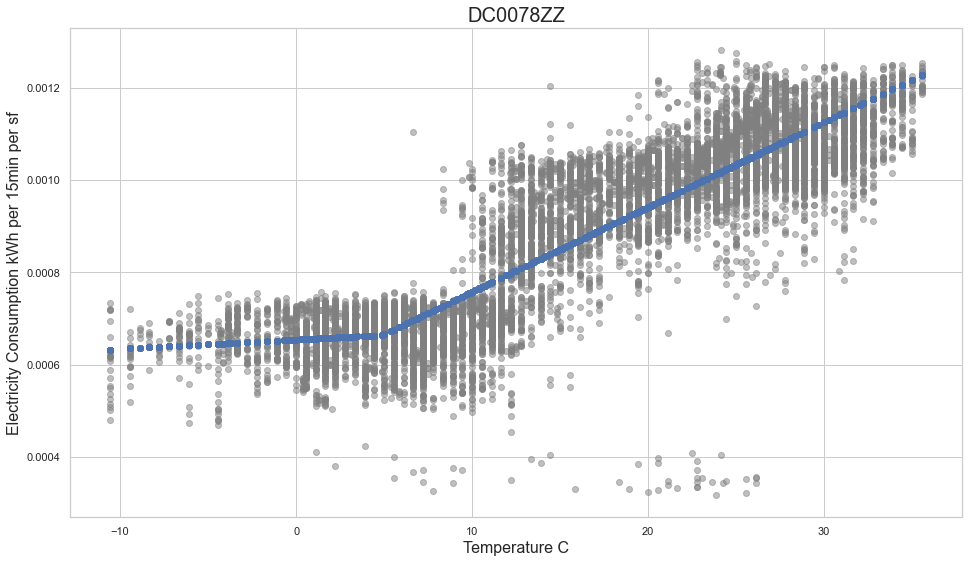

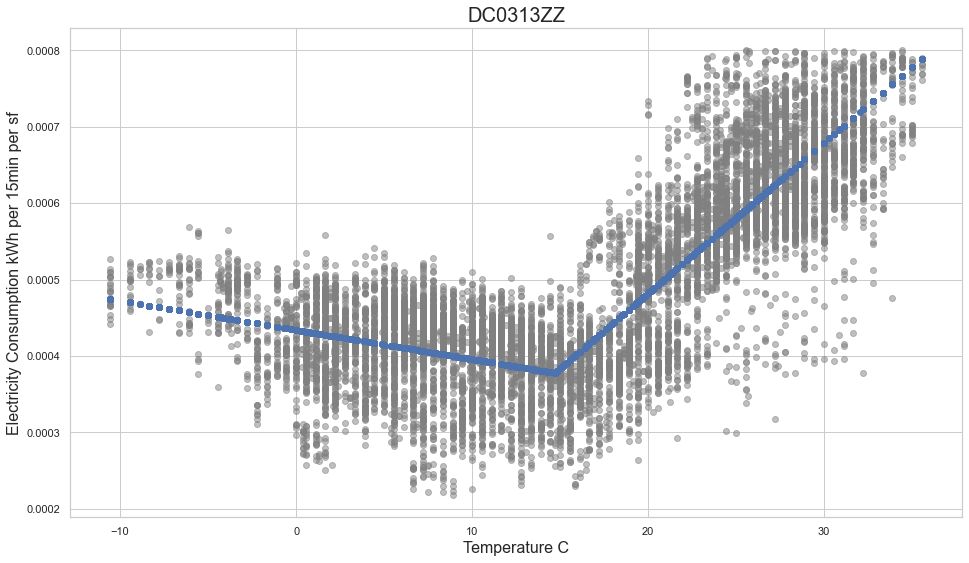

...

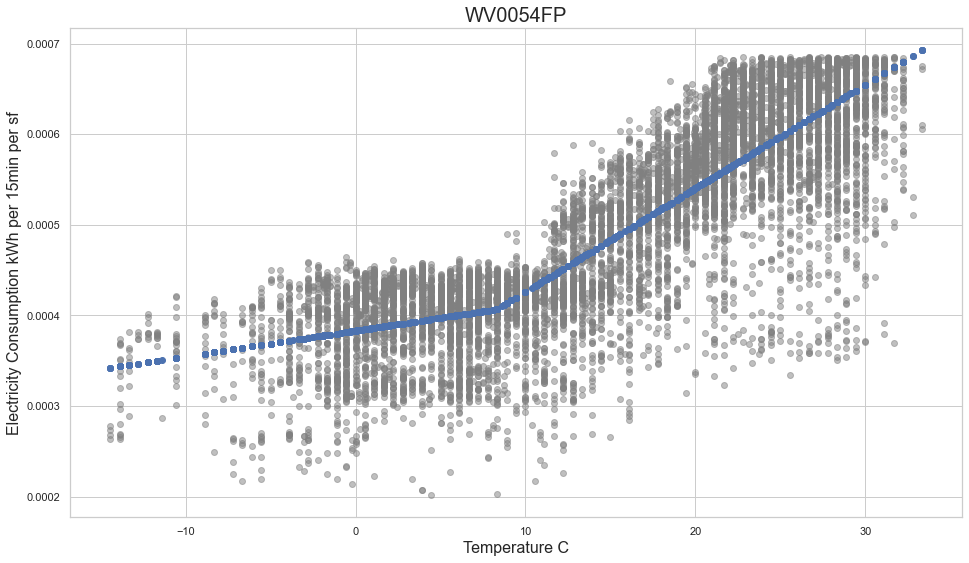

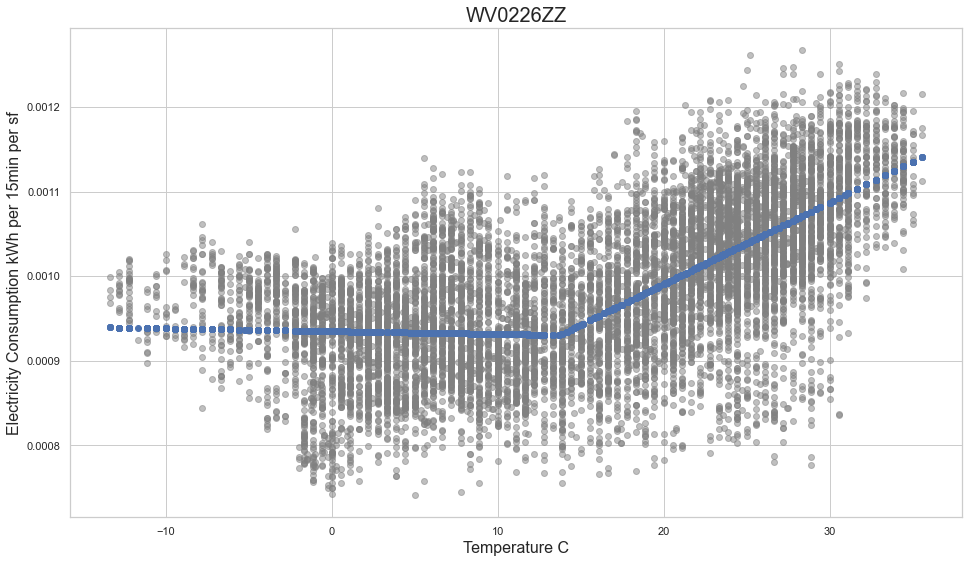

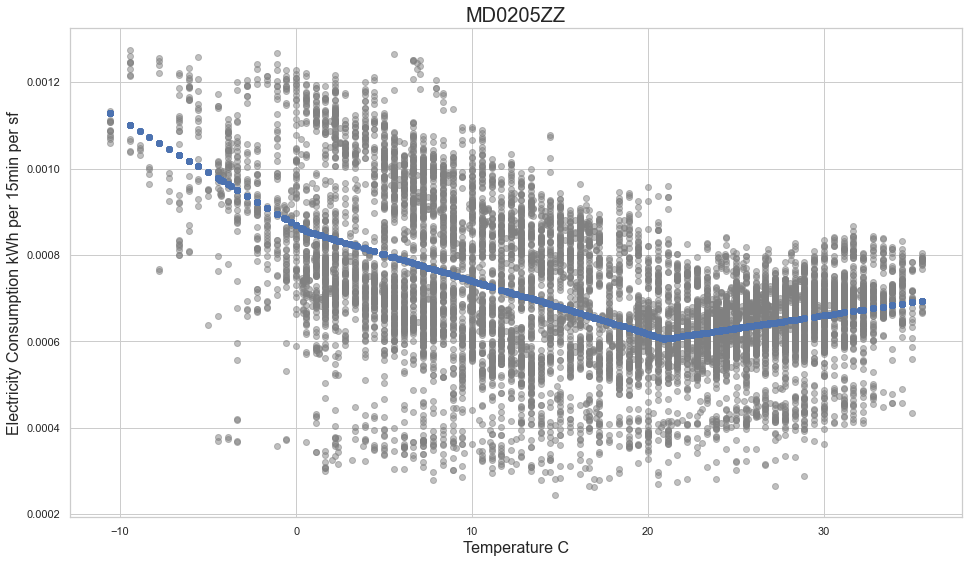

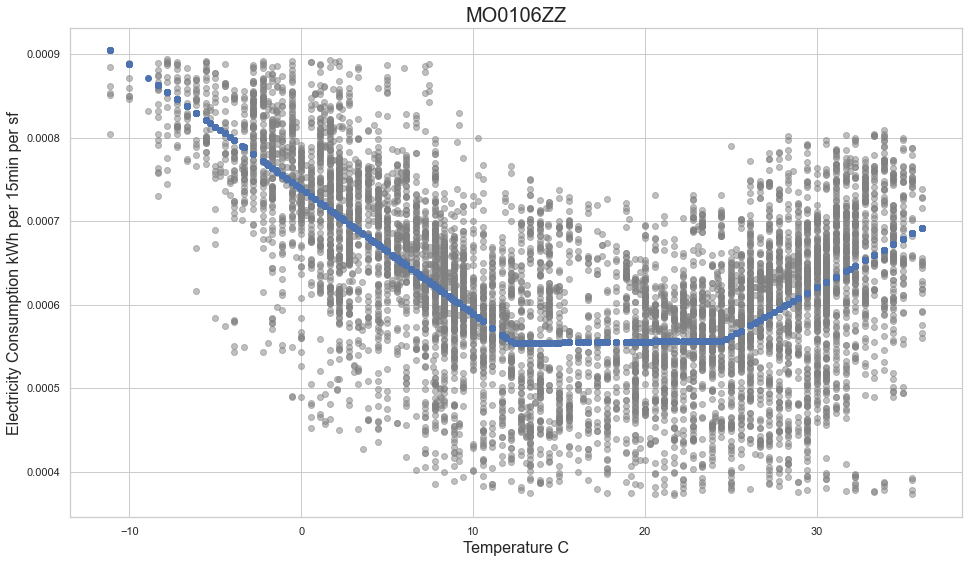

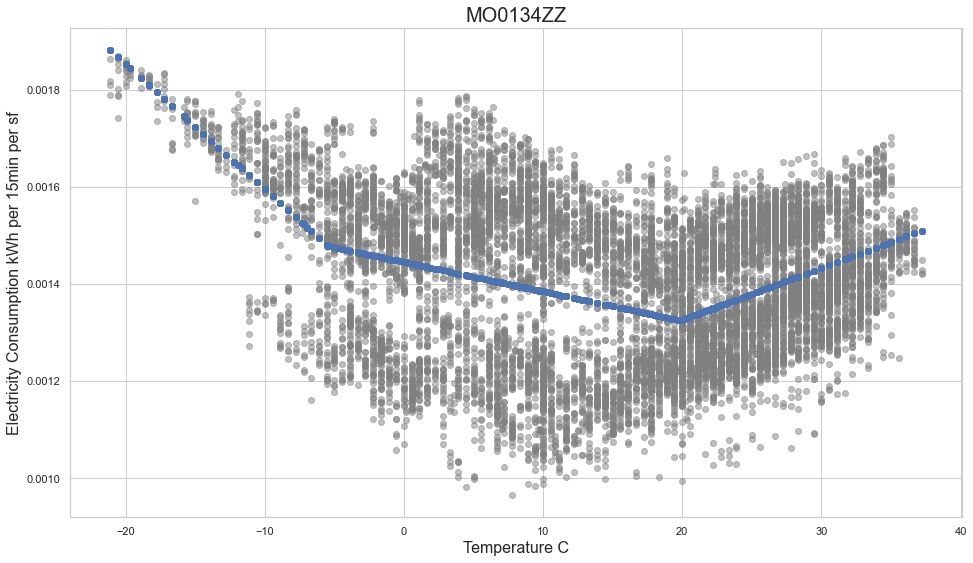

In [18]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[~np.isin(data.index.date, holidays)]
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
    plt.scatter(x, f.predict(x))
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.title(f'{i}', fontsize=20)

### regression without cleaning

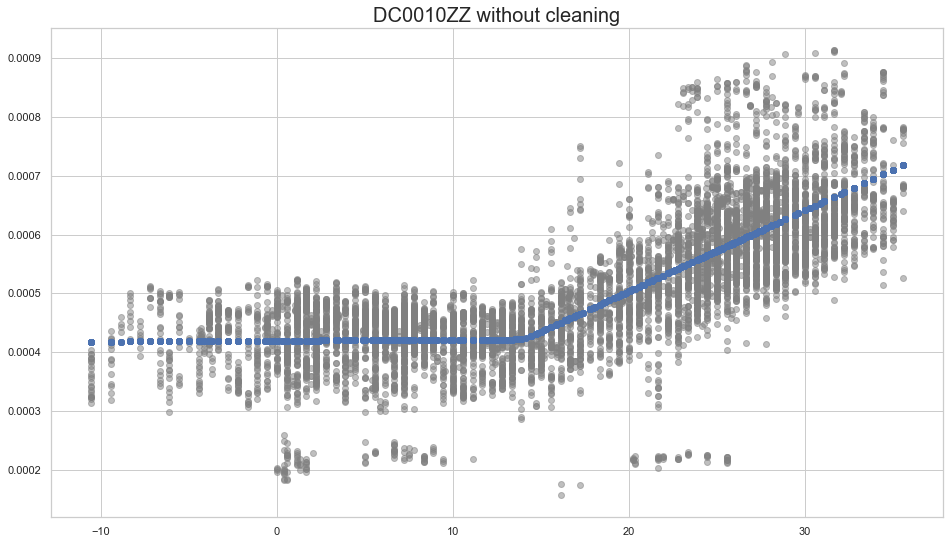

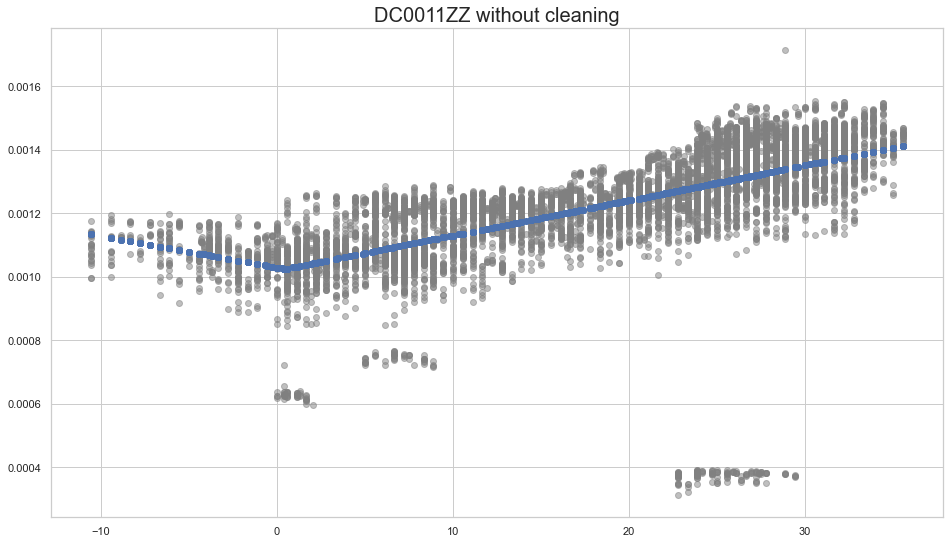

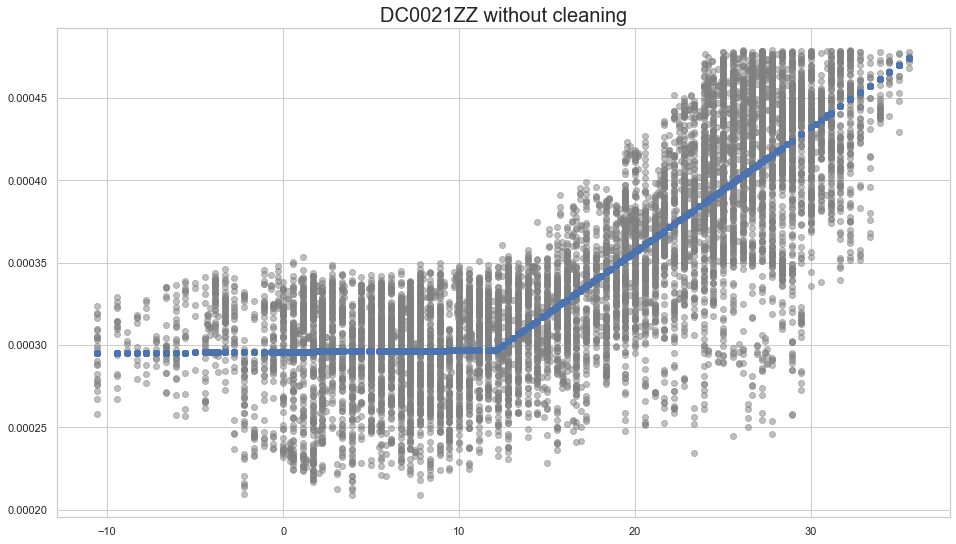

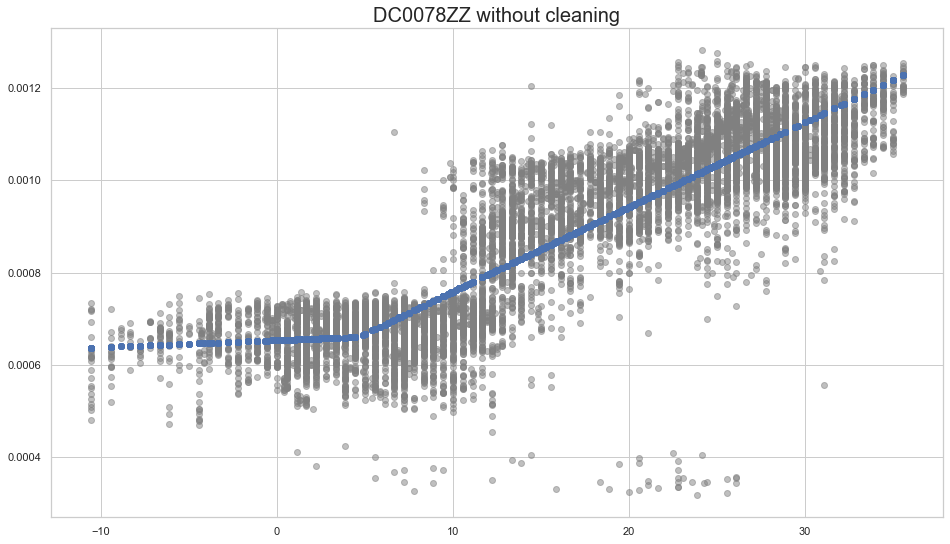

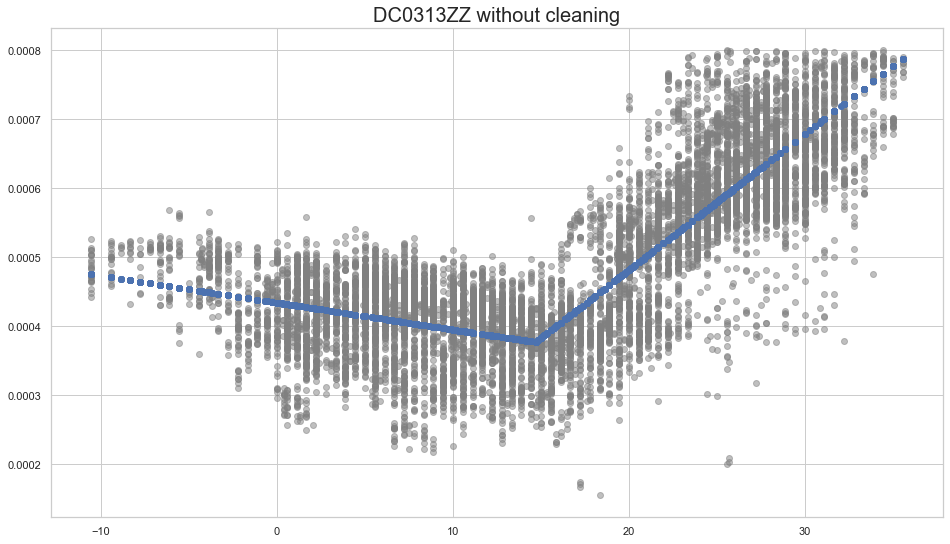

...

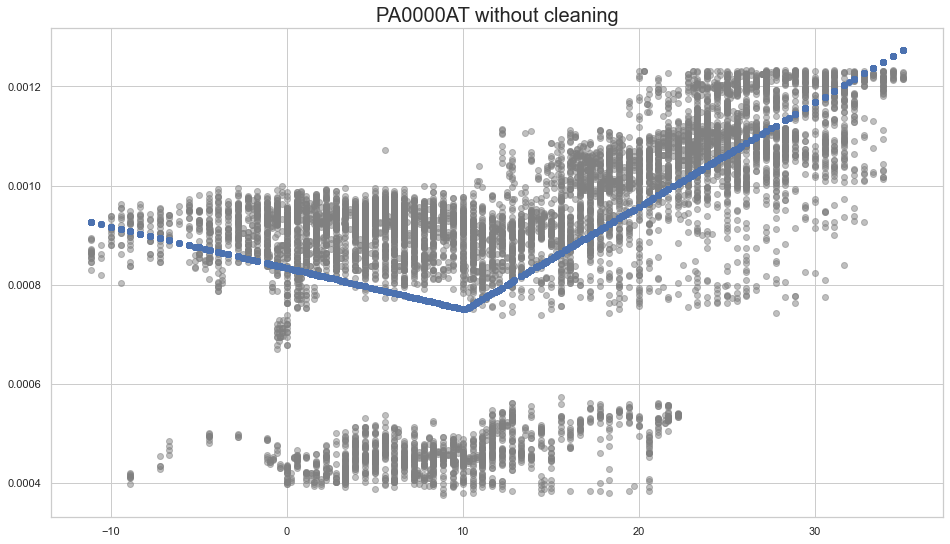

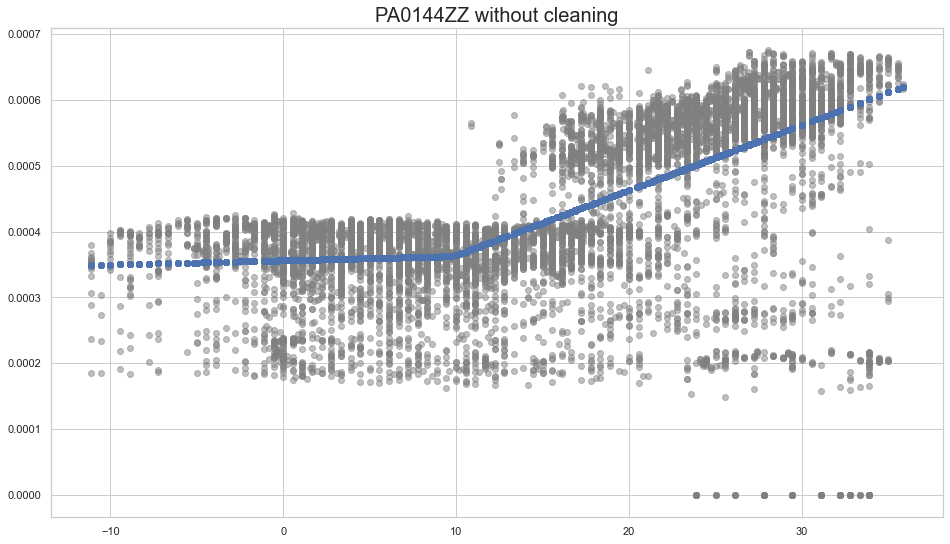

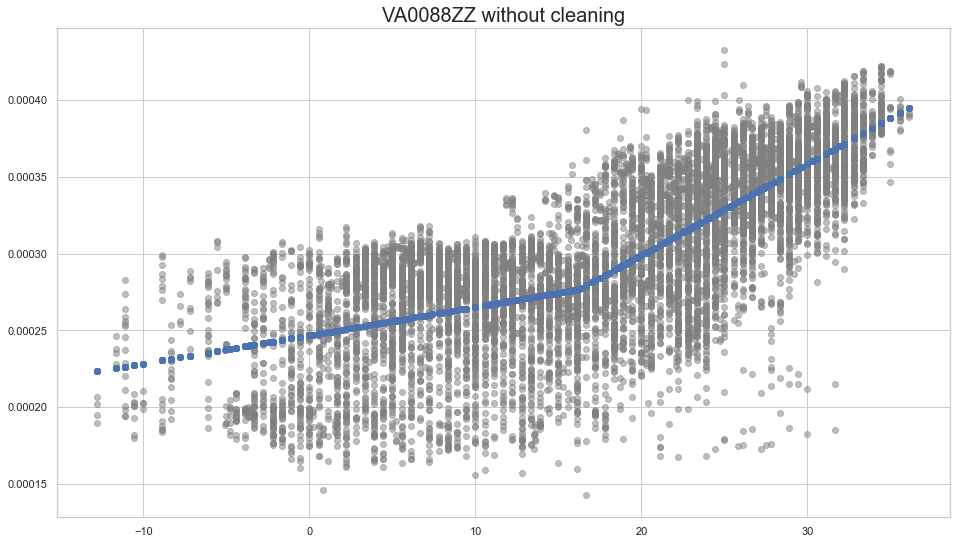

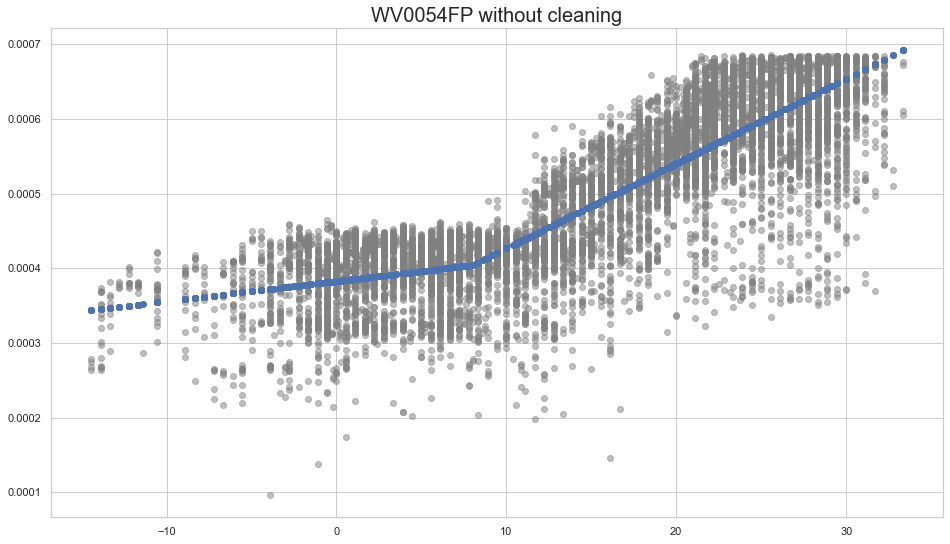

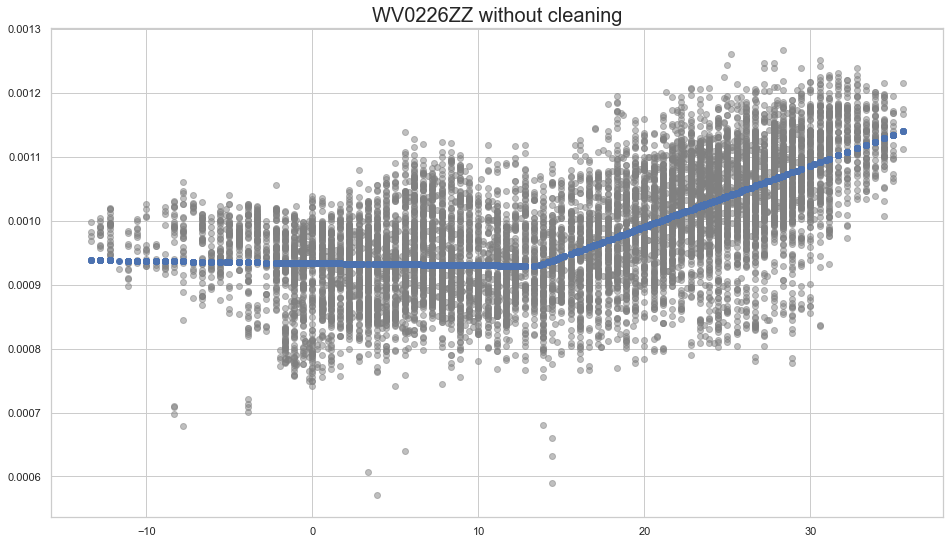

In [160]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[~np.isin(data.index.date, holidays)]
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'], (data)['e']
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    plt.subplots()
    plt.scatter((data)['w'], (data)['e'], c='gray', alpha=0.5)
    plt.scatter(x, f.predict(x))
    plt.title(f'{i} without cleaning', fontsize=20)

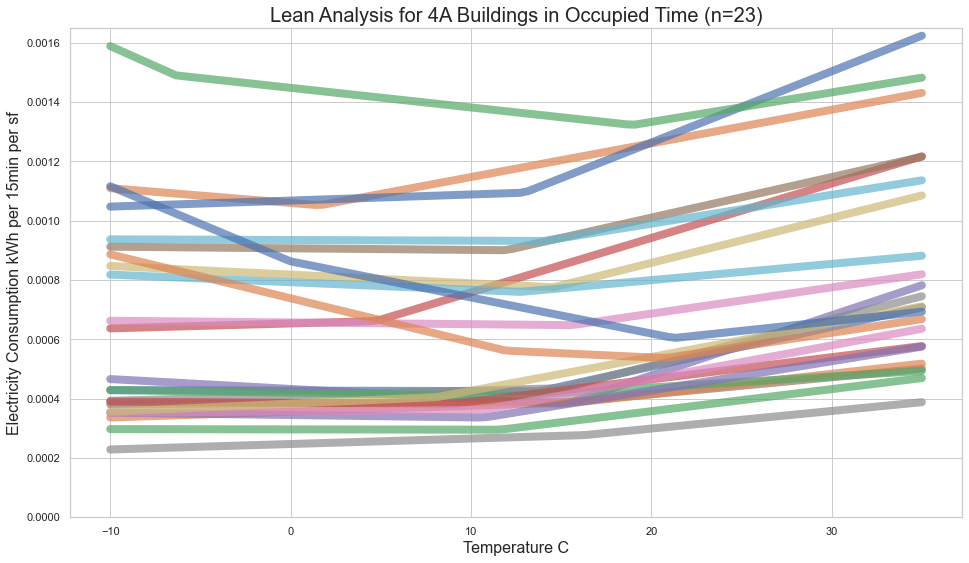

In [17]:
sns.set_style("whitegrid")
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
#     data = data[data > 0]
    data = data.dropna()
    data = data[~np.isin(data.index.date, holidays)]
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
#     plt.legend(loc='upper right')
    plt.title(f'Lean Analysis for 4A Buildings in Occupied Time (n=23)', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.ylim(0, 0.00165)

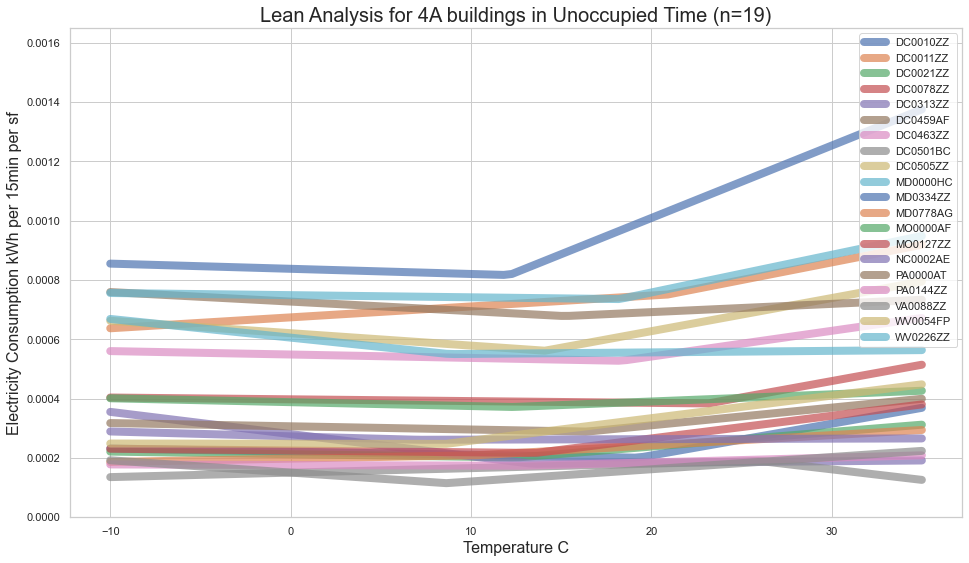

In [189]:
sns.set_style("whitegrid")
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('18:00', '6:00')
    data = pd.concat([a, b])
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    plt.legend(loc='upper right')
    plt.title(f'Lean Analysis for 4A buildings in Unoccupied Time (n=19)', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.ylim(0, 0.00165)

## unoccupied lean details

In [139]:
result = pd.DataFrame()
result['building'] = list(segment.keys())
balance_point = []
slope1, slope2 = [], []
intercept1, intercept2 = [], []

In [140]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('18:00', '6:00')
    data = pd.concat([a, b])
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    
    _, balancePoint, _ = f.fit_breaks
    a1, a2 = f.slopes
    b1, b2 = f.intercepts
    balance_point.append(balancePoint)
    slope1.append(a1)
    slope2.append(a2)
    intercept1.append(b1)
    intercept2.append(b2) 

In [141]:
result['balancePoint'] = balance_point
result['slope1'] = slope1
result['slope2'] = slope2
result['intercept1'] = intercept1
result['intercept2'] = intercept2

In [142]:
result.to_csv('4A 19 unoccupied lean detail.csv', index=False)

In [143]:
pd.read_csv('4A 19 unoccupied lean detail.csv')

,building,balancePoint,slope1,slope2,intercept1,intercept2
0,DC0010ZZ,19.450811,-9.989165e-07,1.082962e-05,0.000221,-0.000009
1,DC0011ZZ,21.381884,3.779939e-06,1.227104e-05,0.000674,0.000492
2,DC0021ZZ,12.324918,-9.279853e-07,4.859696e-06,0.000213,0.000141
3,DC0078ZZ,23.310396,-5.678949e-07,1.126958e-05,0.000397,0.000122
4,DC0313ZZ,13.176656,-7.556432e-06,4.384788e-07,0.000281,0.000175
5,DC0459AF,16.567058,-1.058874e-06,6.010044e-06,0.000307,0.000190
6,DC0463ZZ,17.677290,-1.359747e-06,8.228640e-06,0.000549,0.000380
7,DC0501BC,25.506467,1.547844e-06,-6.217224e-06,0.000150,0.000348
8,DC0505ZZ,14.277143,-4.090774e-06,1.130356e-05,0.000620,0.000401
9,MD0000HC,8.933989,-6.259670e-06,5.423661e-07,0.000606,0.000545


# Occupied lean details

In [152]:
result_occ = pd.DataFrame()
result_occ['building'] = list(segment.keys())
balance_point = []
slope1, slope2 = [], []
intercept1, intercept2 = [], []

In [153]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[~np.isin(data.index.date, holidays)]
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    
    _, balancePoint, _ = f.fit_breaks
    a1, a2 = f.slopes
    b1, b2 = f.intercepts
    balance_point.append(balancePoint)
    slope1.append(a1)
    slope2.append(a2)
    intercept1.append(b1)
    intercept2.append(b2) 

In [154]:
result_occ['balancePoint'] = balance_point
result_occ['slope1'] = slope1
result_occ['slope2'] = slope2
result_occ['intercept1'] = intercept1
result_occ['intercept2'] = intercept2

In [155]:
result_occ

,building,balancePoint,slope1,slope2,intercept1,intercept2
0,DC0010ZZ,14.241131,8.398300e-08,0.000014,0.000427,0.000234
1,DC0011ZZ,2.000304,-4.213855e-06,0.000011,0.001064,0.001032
2,DC0021ZZ,12.028996,6.781413e-08,0.000008,0.000296,0.000206
3,DC0078ZZ,4.721682,1.669526e-06,0.000018,0.000654,0.000575
4,DC0313ZZ,14.407881,-4.095390e-06,0.000019,0.000435,0.000097
5,DC0459AF,15.573904,3.194485e-07,0.000006,0.000384,0.000300
6,DC0463ZZ,16.212108,-3.680479e-07,0.000009,0.000656,0.000502
7,DC0501BC,14.518899,1.395744e-06,0.000015,0.000411,0.000210
8,DC0505ZZ,14.487598,-2.986930e-06,0.000015,0.000818,0.000557
9,MD0000HC,12.770057,-2.563303e-06,0.000005,0.000793,0.000690


In [157]:
result_occ.to_csv('4A 19 occupied lean detail.csv', index=False)

## Occupied without clean

In [161]:
result_occ_ = pd.DataFrame()
result_occ_['building'] = list(segment.keys())
balance_point = []
slope1, slope2 = [], []
intercept1, intercept2 = [], []

In [162]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[~np.isin(data.index.date, holidays)]
    data = data[data.index.weekday < 5].between_time('6:00', '18:00')
    
#     clustering = DBSCAN(eps=5, min_samples=8).fit(data)
#     res = np.unique(clustering.labels_, return_counts=True)
#     maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'], (data)['e']
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    
    _, balancePoint, _ = f.fit_breaks
    a1, a2 = f.slopes
    b1, b2 = f.intercepts
    balance_point.append(balancePoint)
    slope1.append(a1)
    slope2.append(a2)
    intercept1.append(b1)
    intercept2.append(b2) 

In [163]:
result_occ_['balancePoint'] = balance_point
result_occ_['slope1'] = slope1
result_occ_['slope2'] = slope2
result_occ_['intercept1'] = intercept1
result_occ_['intercept2'] = intercept2

In [164]:
result_occ_

,building,balancePoint,slope1,slope2,intercept1,intercept2
0,DC0010ZZ,14.155197,2.150374e-07,0.000014,0.000419,0.000227
1,DC0011ZZ,0.769681,-8.852687e-06,0.000011,0.001035,0.001020
2,DC0021ZZ,12.166279,1.230989e-07,0.000008,0.000296,0.000205
3,DC0078ZZ,4.939936,2.094340e-06,0.000018,0.000654,0.000574
4,DC0313ZZ,14.914957,-3.665400e-06,0.000020,0.000434,0.000082
5,DC0459AF,10.892344,-3.099050e-06,0.000007,0.000355,0.000242
6,DC0463ZZ,15.881785,-4.925733e-07,0.000009,0.000657,0.000507
7,DC0501BC,15.023686,2.138599e-06,0.000016,0.000402,0.000200
8,DC0505ZZ,11.812131,-3.414026e-06,0.000016,0.000766,0.000542
9,MD0000HC,30.887509,1.937122e-06,-0.000049,0.000768,0.002329


In [165]:
result_occ_.to_csv('4A 19 occupied lean detail without cleaning.csv', index=False)

## Unoccupied without clean

In [166]:
result_unocc_ = pd.DataFrame()
result_unocc_['building'] = list(segment.keys())
balance_point = []
slope1, slope2 = [], []
intercept1, intercept2 = [], []

In [167]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('18:00', '6:00')
    data = pd.concat([a, b])
    
#     clustering = DBSCAN(eps=5, min_samples=8).fit(data)
#     res = np.unique(clustering.labels_, return_counts=True)
#     maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'], (data)['e']
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    
    _, balancePoint, _ = f.fit_breaks
    a1, a2 = f.slopes
    b1, b2 = f.intercepts
    balance_point.append(balancePoint)
    slope1.append(a1)
    slope2.append(a2)
    intercept1.append(b1)
    intercept2.append(b2) 

In [168]:
result_unocc_['balancePoint'] = balance_point
result_unocc_['slope1'] = slope1
result_unocc_['slope2'] = slope2
result_unocc_['intercept1'] = intercept1
result_unocc_['intercept2'] = intercept2

In [169]:
result_unocc_

,building,balancePoint,slope1,slope2,intercept1,intercept2
0,DC0010ZZ,18.965711,-1.094333e-06,1.090432e-05,0.000221,-0.000006
1,DC0011ZZ,23.061149,3.062974e-06,1.564826e-05,0.000680,0.000390
2,DC0021ZZ,13.100086,-7.710446e-07,5.091549e-06,0.000213,0.000136
3,DC0078ZZ,22.892283,-6.522587e-07,1.058189e-05,0.000398,0.000141
4,DC0313ZZ,13.125982,-7.567580e-06,4.233996e-07,0.000281,0.000176
5,DC0459AF,11.744598,-3.733027e-06,7.452961e-06,0.000285,0.000153
6,DC0463ZZ,18.012444,-1.238122e-06,8.463297e-06,0.000549,0.000374
7,DC0501BC,25.803582,1.528099e-06,-6.728851e-06,0.000150,0.000363
8,DC0505ZZ,13.956357,-3.482435e-06,1.158180e-05,0.000605,0.000394
9,MD0000HC,8.725426,-6.593755e-06,6.797004e-07,0.000608,0.000544


In [171]:
result_unocc_.to_csv('4A 19 unoccupied lean detail without cleaning.csv', index=False)

# balance point comparision Occ vs Unocc

In [178]:
df = pd.DataFrame()

In [179]:
df['Occupied'] = result_occ['balancePoint']
df['Unoccupied'] = result['balancePoint']

Text(0.5, 1.0, 'Blance Points for Buildings in 4A (n=19)')

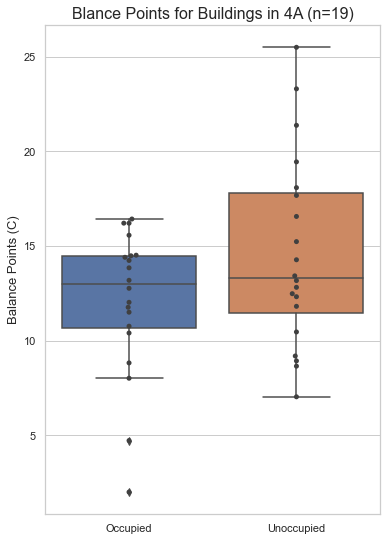

In [185]:
fig, ax = plt.subplots(figsize=(6,9))
ax = sns.boxplot(data=df, orient='v')
ax = sns.swarmplot(data=df, color=".25", orient='v')
plt.ylabel('Balance Points (C)', size=13)
plt.title('Blance Points for Buildings in 4A (n=19)', size=16)